name

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# suppress future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [39]:
from helpers import *

In [40]:
training_filters = [
    {
        'feature': 'month',
        'operator': 'between',
        'value': [0, 13]
    }
]

validation_filters = [
    {
        'feature': 'date_forecast',
        'operator': 'between',
        'value': ['2020-05-01', '2020-07-01']
    }
]

test_filters = [
    {
        'feature': 'date_forecast',
        'operator': 'between',
        'value': ['2021-05-01', '2021-07-01']
    }
]


agg_strats = ['mean']

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X, y = m_wrap.get_train(True,False, False, False)
X.columns = X.columns.str.replace('mean_','')
Xy = pd.concat([X,y], axis=1)

# EDA

## Search domain knowledge ->C
GHI
Studying other projects approach (with citation maybe)
What the feature are on the forecasting site

##  Check if the data is intuitive -> C
saying something about most the feature
-  ceiling no -666 and some na (are they the same ?) same for cloud base
- clear sky is intuitive that is smooth
- direct is intuitive that is somehow like clear but noisy

## How the data was generated -> C

## Explore individual features -> L
plot of individual feature (all and daily) and comment a little

## Explore pairs and group of features -> L
correlation matrix and single plot of feature really corrrelated and explanation of corrmat

## Clean up features ->C
snow features not intresting 
elevation to remove and add categorical 
pv_measurement cleaning 



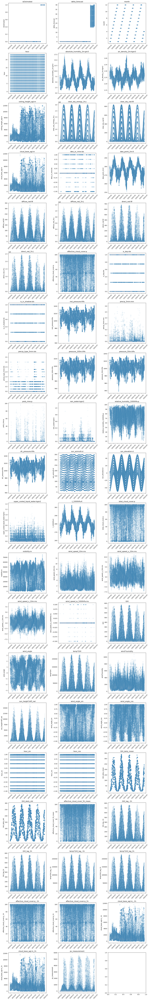

In [41]:
# individual features
n_cols = 3
n_rows = Xy.select_dtypes(include=np.number).shape[1] // n_cols + 1

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))

axes = axs.flatten()

for i, col in enumerate(Xy.select_dtypes(include=np.number).columns):
    sns.scatterplot(data=Xy, x='date_forecast',y=col, ax=axes[i],alpha=0.05)
    for tick in axes[i].get_xticklabels():
        tick.set_rotation(45)
    axes[i].set_title(col)
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

In the last plot all individual, numerical features are plotted over time. We did not differentiate by building_id here, because most features are distributed very similarly. This is visualized in the next plot. 
When looking at the general shape of the features, we can see that many follow seasonal trends. This is especially true for theoretical or astronomic features, as clear sky radiation, sun elevation, but also features like temperature and rain. The cloud height features seem to have a concept shift at the start of 2020. 

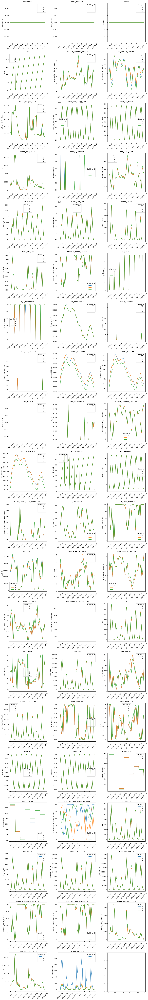

In [42]:
# individual features
n_cols = 3
n_rows = Xy.select_dtypes(include=np.number).shape[1] // n_cols + 1

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))

axes = axs.flatten()

for i, col in enumerate(Xy.select_dtypes(include=np.number).columns):
    sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18')], x='date_forecast',y=col, ax=axes[i],alpha=0.8,hue='building_id')
    for tick in axes[i].get_xticklabels():
        tick.set_rotation(45)
    axes[i].set_title(col)
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

This plot emphasizes the similarity of the different features for the 3 buildings. This indicates, that the buildings are located in the same area. One notable exception is the target variable pv measurement. Building A seems to have many more solar panels, as its energy production is up to 5 times higher than the other buildings. Also the pressure of building C differs significantly but not by a lot.

<Axes: >

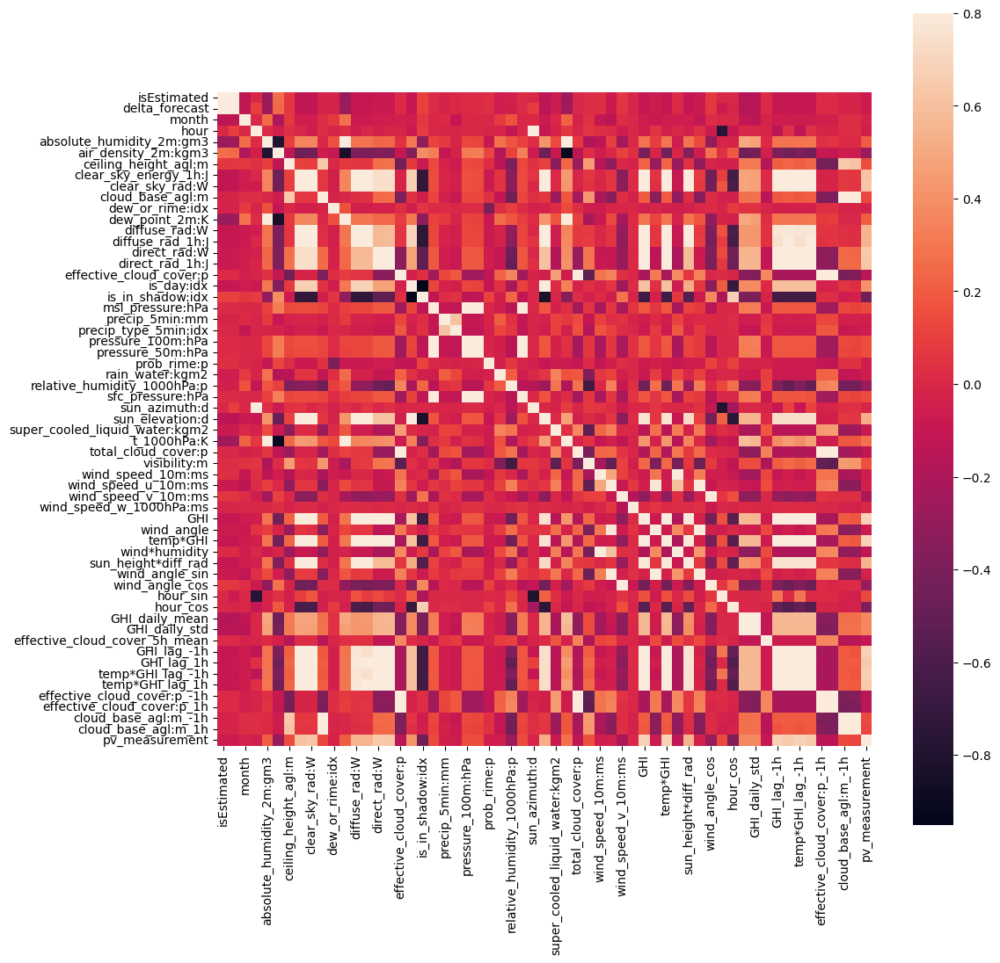

In [43]:
# groups of features
corrmat = Xy.corr(numeric_only=True)
plt.figure(figsize=(12, 12))
sns.heatmap(corrmat, vmax=.8, square=True)

This figure shows a correlation matrix between all features. We can see groups of features that are closely related, which is also intuitive from the features name. For example the cloud height features. Also the radiation features are correlated with each other as well as with the pv measurement. Ignoring the scale, the clear sky radiation seems to be the maximum for the pv measurement while direct and diffuse radiation more closely follow the shape of the pv measurement (next plot).

<Axes: xlabel='date_forecast', ylabel='clear_sky_rad:W'>

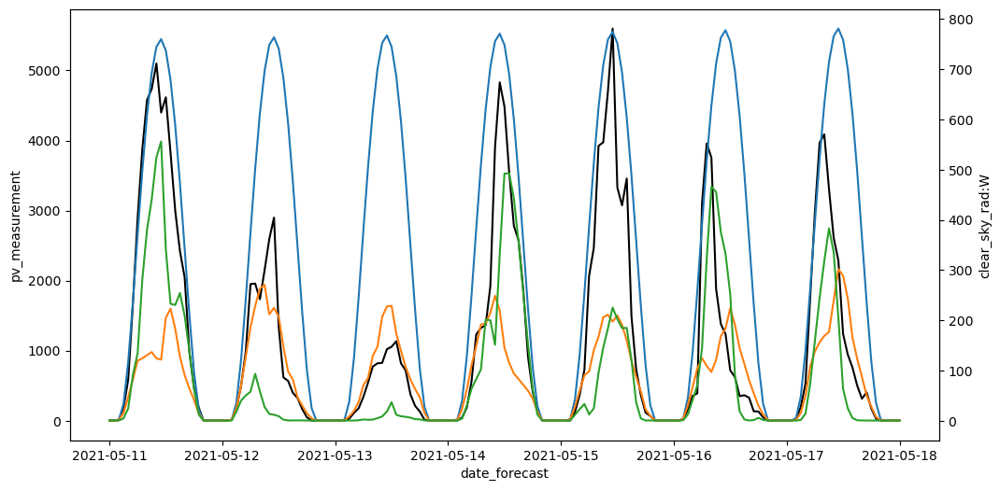

In [54]:
# 
plt.figure(figsize=(12, 6))
ax = plt.gca()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='pv_measurement',color='black',ax=ax)
ax_twin = ax.twinx()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='clear_sky_rad:W',ax=ax_twin)
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='diffuse_rad:W',ax=ax_twin)
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='direct_rad:W',ax=ax_twin)


# diffuse, clear sky, total rad vs pv 

In the next plot, we compare the different units of direct radiation. While J indicates that this measured the energy over an hour, W indicates the power at a certain point. Still, they are very similar.

<Axes: xlabel='direct_rad:W', ylabel='direct_rad_1h:J'>

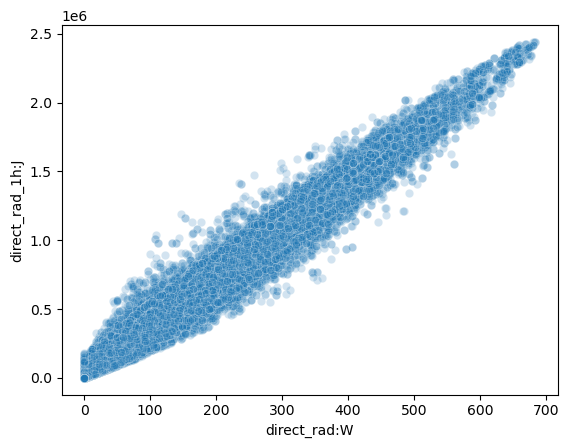

In [59]:
# compare units of direct_rad:W', 'direct_rad_1h:J
sns.scatterplot(data=Xy, x='direct_rad:W',y='direct_rad_1h:J',alpha=0.2)

# Feature engineering

## Feature selection -> C
pca explain but the drop idea

## Feature extraction -> L
lag feature
ghi
mean cloud 5 h
aggregation methods
(helper)


To verify the proportion off diffuse and total radiation on the pv measurement, we ran a simple linear regression. 

In [57]:
# linear regression of pv_measurement vs diffuse and direct radiation
from sklearn.linear_model import LinearRegression
lreg = LinearRegression(fit_intercept=False)
lreg.fit(Xy[['diffuse_rad:W','direct_rad:W']], Xy['pv_measurement'])
lreg.coef_

array([3.52665  , 3.4347808], dtype=float32)

This resulted in an equal proportion, so we created the new feature 'GHI' by adding the diffuse and direct radiation. In the next plot, you can see that GHI has similar patterns as the pv measurement.

<Axes: xlabel='date_forecast', ylabel='GHI'>

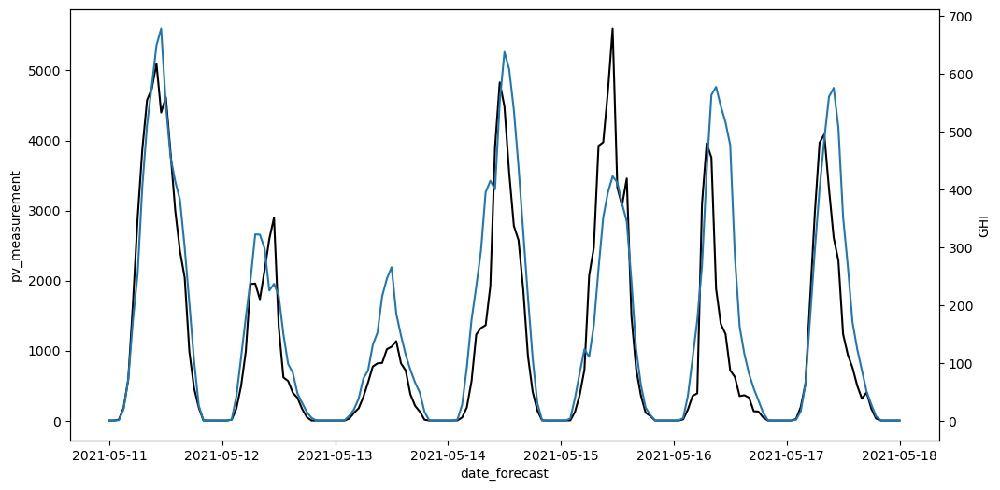

In [60]:
# 
plt.figure(figsize=(12, 6))
ax = plt.gca()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='pv_measurement',color='black',ax=ax)
ax_twin = ax.twinx()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='GHI',ax=ax_twin)


# diffuse, clear sky, total rad vs pv 

Apart from this, we added other features based on intuition and research. To give the model a sense of time, we extracted the month and hour of the day. To make this continous between the day, we used sin and cos to encode it. We also added the wind angle.


- time
    - hour
    - month

- GHI
    - daily mean and std

- lag features
GHI_lag +/1 1h
GHI
effective cloud cover

- 5h cloud

- sin/cos
time
wind_angle

- interaction features -> trial and error
temp*ghi

# Modeling

## Random forest not tuned (170)->C

## Double model (observed estimated) (really bad results)-> C
-> bad idea -> xgboost

## Changing idea on splitting->C

## XGBoost (160) ->C
tuning tuning with bayesian search

## LightGBM -> C
tuning same as xgboost not better results tuning with gridsearch

## Catboost (151) (still only mean) -> L
little tuning 

##  Catboost (148) new aggrregation -> L
not gridsearch but just final results (we tuned as lightbm)

## Ensembling -> L
Different aggregation strategy and also 4 model with 4 random seed each

## Postprocessing -> L
clip, no prediction after -1 sun elevation, Linear regression reasoning, classification reasoning


# Model interpretation -> L
16 fetures importance or lime, they should be same so explain which feature are more important and why. 
